# 标准化所有井

In [9]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import scipy.signal as signal

import os

# from after_standard_utils import *
from data_clean_utils import *

In [3]:
!pwd
%load_ext autoreload
%autoreload 2

/home/cldai/sciresearch/logcomplete/process


In [4]:
param = {}

##
param['stan_md_fea'] = ['WELL', 'DEPTH_MD','GR','RHOB','NPHI','DTC', 
                        'FORCE_2020_LITHOFACIES_LITHOLOGY']  
param['md_fea'] = ['DEPTH_MD','GR','RHOB','NPHI','DTC']
param['well_md_fea'] = ['WELL', 'DEPTH_MD','GR','RHOB','NPHI','DTC']
param['fea'] = ['GR','RHOB','NPHI','DTC'] 
param['md'] = ['DEPTH_MD']
param['well_md'] = ['WELL','DEPTH_MD']

param['all_logs'] = ['WELL', 'DEPTH_MD', 'CALI','DCAL','GR','RHOB','DRHO','NPHI','DTC',
                    'GROUP', 'FORCE_2020_LITHOFACIES_LITHOLOGY']
param['with_CALI'] = ['CALI','DCAL','GR','RHOB','DRHO','NPHI','DTC']  

param['file_path'] = '/home/cldai/sciresearch/logcomplete/data/Teamdata/'
param['file_save_path'] = '/home/cldai/sciresearch/logcomplete/data/Teamdata/standard_wells/minish_area/'
param['fig_path'] = '/home/cldai/sciresearch/logcomplete/figure/'

param['marked_well'] = '16/7-6'  #
# param['marked_well2'] = '15/9-23'   
# param['marked_well3'] = '25/6-1'  #'16/7-6'


## 读取训练验证测试数据集并cat到一起

In [5]:
train_ori_set = pd.read_csv(param['file_path'] + 'train1.csv', engine = 'python')
print('训练集读取完成！')
val_ori_set = pd.read_csv(param['file_path'] + 'board_test.csv', engine = 'python')
test_ori_set = pd.read_csv(param['file_path'] + 'test.csv', engine = 'python' )

训练集读取完成！


### 以下为缩减数据集并重新划分训、验、测井
* 该部分去掉程序也可继续，只是数据为所有的井数据

In [6]:
##在well_loc_proj.ipynb中已经重新选择并划分了数据井
train_name = ['30/3-3', '30/3-5 S', '30/6-5', '31/2-1', '31/2-19 S', '31/2-7', '31/2-8', 
              '31/2-9', '31/3-1', '31/3-2', '31/3-3', '31/3-4', '31/4-10', '31/4-5', '31/5-4 S', 
              '31/6-5', '31/6-8', '33/6-3 S', '33/9-1', '33/9-17', '34/10-21', '34/10-33', 
              '34/10-35', '34/11-1', '34/11-2 S', '34/12-1', '34/2-4', '34/3-1 A', '34/4-10 R', 
              '34/5-1 A', '34/5-1 S', '34/7-21', '34/8-1', '34/8-3', '34/8-7 R', '35/11-1', 
              '35/11-10', '35/11-11', '35/11-12', '35/11-13', '35/11-15 S', '35/11-6', '35/11-7', 
              '35/12-1', '35/4-1', '35/8-4', '35/8-6 S', '35/9-10 S', '35/9-2', '35/9-5', 
              '35/9-6 S', '36/7-3', '29/3-1', '34/3-3 A', '35/6-2 S', '34/3-2 S']
val_name  = ['34/7-20', '34/10-16 R', '34/6-1 S', '35/9-8', '31/2-21 S']
test_name = ['34/10-19', '34/7-13', '31/2-10', '35/11-5', '35/9-7']
print('test_name', test_name)

test_name ['34/10-19', '34/7-13', '31/2-10', '35/11-5', '35/9-7']


In [7]:
##拼接数据集
all_set_ori = pd.concat([train_ori_set, val_ori_set, test_ori_set], axis=0)


train_set = cat_well(train_name, all_set_ori)
val_set = cat_well(val_name, all_set_ori)
test_set = cat_well(test_name, all_set_ori)

print('训练井个数', len(train_set.WELL.unique()))
print('验证井个数', len(val_set.WELL.unique()))
print('测试井个数', len(test_set.WELL.unique()))

井名 30/3-3
井名 30/3-5 S
井名 30/6-5
井名 31/2-1
井名 31/2-19 S
井名 31/2-7
井名 31/2-8
井名 31/2-9
井名 31/3-1
井名 31/3-2
井名 31/3-3
井名 31/3-4
井名 31/4-10
井名 31/4-5
井名 31/5-4 S
井名 31/6-5
井名 31/6-8
井名 33/6-3 S
井名 33/9-1
井名 33/9-17
井名 34/10-21
井名 34/10-33
井名 34/10-35
井名 34/11-1
井名 34/11-2 S
井名 34/12-1
井名 34/2-4
井名 34/3-1 A
井名 34/4-10 R
井名 34/5-1 A
井名 34/5-1 S
井名 34/7-21
井名 34/8-1
井名 34/8-3
井名 34/8-7 R
井名 35/11-1
井名 35/11-10
井名 35/11-11
井名 35/11-12
井名 35/11-13
井名 35/11-15 S
井名 35/11-6
井名 35/11-7
井名 35/12-1
井名 35/4-1
井名 35/8-4
井名 35/8-6 S
井名 35/9-10 S
井名 35/9-2
井名 35/9-5
井名 35/9-6 S
井名 36/7-3
井名 29/3-1
井名 34/3-3 A
井名 35/6-2 S
井名 34/3-2 S
井名 34/7-20
井名 34/10-16 R
井名 34/6-1 S
井名 35/9-8
井名 31/2-21 S
井名 34/10-19
井名 34/7-13
井名 31/2-10
井名 35/11-5
井名 35/9-7
训练井个数 56
验证井个数 5
测试井个数 5


***
### 注意是哪个数据，原工区数据 or mini_area(缩小原工区)工区数据

In [6]:
train_set = train_ori_set[param['all_logs']].copy()  #原工区数据
#train_set = train_set[param['all_logs']].copy()  #mini_area(缩小原工区)工区数据
train_len = len(train_set)

val_set = val_ori_set[param['all_logs']].copy()  #原工区数据
#val_set = val_set[param['all_logs']].copy()  #mini_area(缩小原工区)工区数据
val_len = len(val_set)

test_set = test_ori_set[param['all_logs']].copy()  #原工区数据
#test_set = test_set[param['all_logs']].copy()  #mini_area(缩小原工区)工区数据
test_len = len(test_set)

##拼接数据集
all_set = pd.concat([train_set, val_set, test_set], axis=0)
print('总数据长度', len(all_set))

print('all_set.columns', all_set.columns, all_set.shape)
print('all_set.head()', all_set)

总数据长度 1429694
all_set.columns Index(['WELL', 'DEPTH_MD', 'CALI', 'DCAL', 'GR', 'RHOB', 'DRHO', 'NPHI', 'DTC',
       'GROUP', 'FORCE_2020_LITHOFACIES_LITHOLOGY'],
      dtype='object') (1429694, 11)
all_set.head()            WELL   DEPTH_MD       CALI  DCAL          GR      RHOB      DRHO  \
0       15/9-13   494.5280  19.480835   NaN   80.200851  1.884186 -0.574928   
1       15/9-13   494.6800  19.468800   NaN   79.262886  1.889794 -0.570188   
2       15/9-13   494.8320  19.468800   NaN   74.821999  1.896523 -0.574245   
3       15/9-13   494.9840  19.459282   NaN   72.878922  1.891913 -0.586315   
4       15/9-13   495.1360  19.453100   NaN   71.729141  1.880034 -0.597914   
...         ...        ...        ...   ...         ...       ...       ...   
122392   35/9-7  2973.2988   8.276272   NaN   90.720284       NaN  0.502458   
122393   35/9-7  2973.4508   8.267273   NaN   87.062027       NaN  0.374753   
122394   35/9-7  2973.6028   8.250099   NaN   86.115921       NaN  0.211487

### 绘制原始所有井的测井属性图

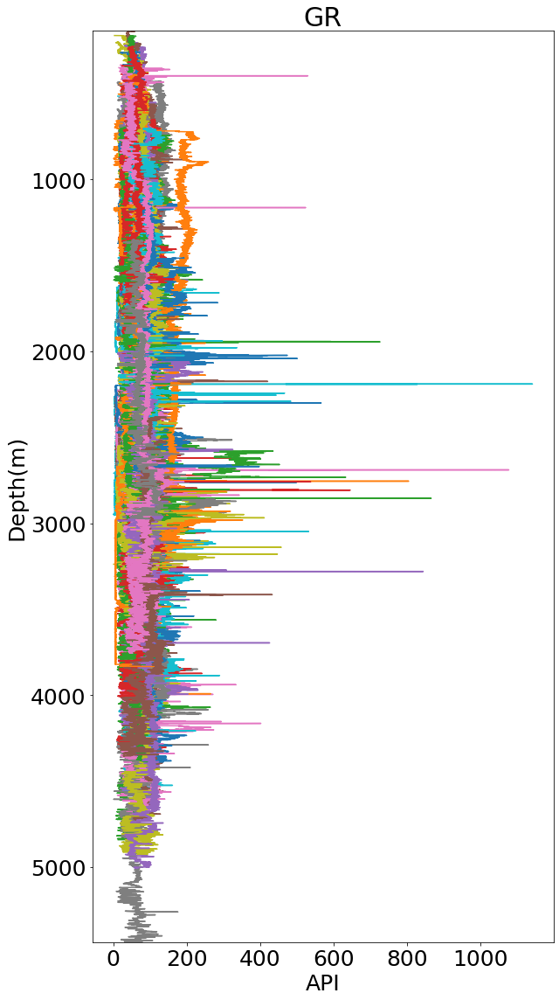

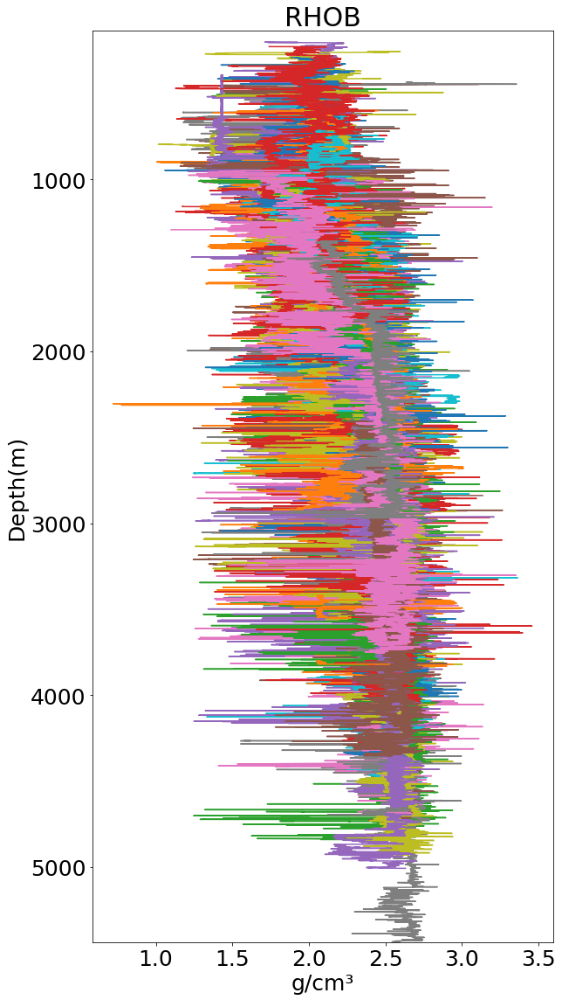

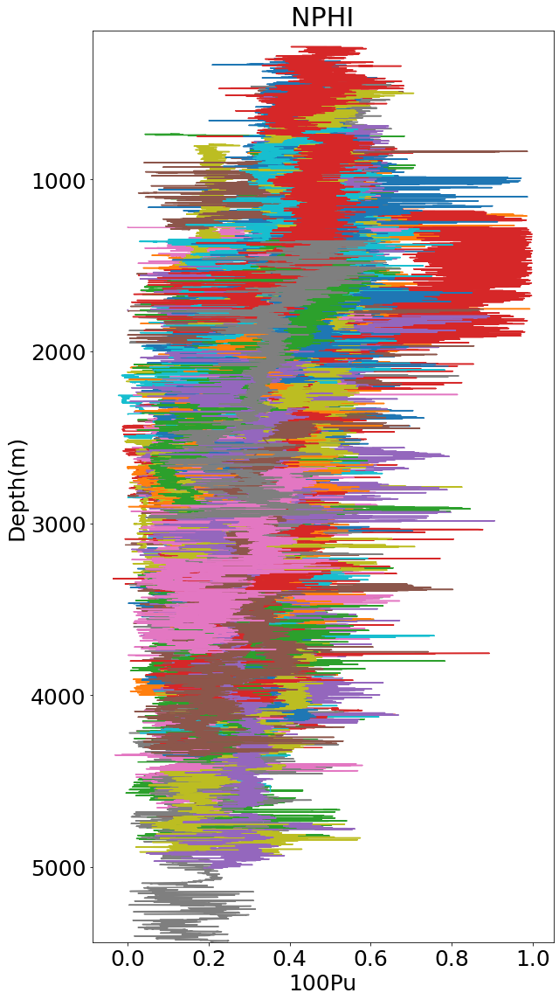

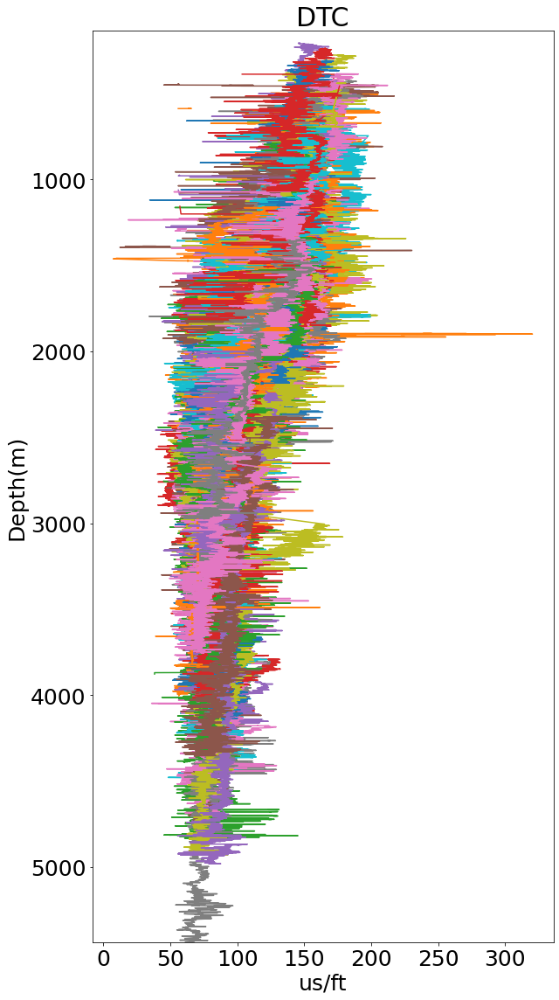

In [10]:
plot_all_wells_fea(all_set, 'GR', param['fig_path'], state='ori')
plot_all_wells_fea(all_set, 'RHOB', param['fig_path'], state='ori')
plot_all_wells_fea(all_set, 'NPHI', param['fig_path'], state='ori')
plot_all_wells_fea(all_set, 'DTC', param['fig_path'], state='ori')

### **先做中值滤波去除异常值，再后续做标准化**
* 是先中值滤波去异常，还是先用原数据做标准化然后滤波，这是一个问题

* **这里只给GR、RHOB、NPHI、DTC曲线做中值滤波，其他曲线不做**
* **需要注意这里滤波后变量名还是all_set**

In [11]:
param['fea_need_filt'] = ['GR', 'RHOB', 'NPHI', 'DTC']
param['filt_size'] = 19
all_set = medfilt_by_need(all_set, param['filt_size'], param['fea_need_filt'])


col GR
col RHOB
col NPHI
col DTC


In [12]:
gp_null = all_set['GROUP'].isnull().sum()
print('所有数据的GROUP中有多少null值', gp_null)  ##有1278个

所有数据的GROUP中有多少null值 1278


## 选择标准井
* 按深度绘制标准井(包括岩性)，之后观察
* 标准井选取要包含所要的全部曲线
* 看地质对测井曲线的控制是否好；没有因随机因素损坏的井眼。
* 看所含的群GROUP是否全，尽可能找到每口井共有的群GROUP(也是为标准层的选取做准备)
* **Shale泥岩65000用数值2000表示**
* imshow方法还有错误，不能正确划分区间，并且有些小区间、互层区间也没有plot的线图清晰

### 查看数据集的组数目及种类

In [13]:
##gp_name is group_name; gp_num is group_num
gp_name = all_set['GROUP'].unique()
gp_num = len(gp_name)
print('gp_num', gp_num, 'gp_name', gp_name)

gp_num 15 gp_name ['NORDLAND GP.' 'HORDALAND GP.' 'ROGALAND GP.' 'SHETLAND GP.'
 'CROMER KNOLL GP.' 'VIKING GP.' 'VESTLAND GP.' 'ZECHSTEIN GP.'
 'HEGRE GP.' 'ROTLIEGENDES GP.' 'TYNE GP.' 'BOKNFJORD GP.' 'DUNLIN GP.'
 'BAAT GP.' nan]


### 绘图查看所有验证井的群及岩性(为标准层选取做准备)

验证井名： 15/9-14
验证井名： 25/10-10
验证井名： 25/11-24
验证井名： 25/5-3
验证井名： 29/3-1
验证井名： 34/10-16 R
验证井名： 34/3-3 A
验证井名： 34/6-1 S
验证井名： 35/6-2 S
验证井名： 35/9-8


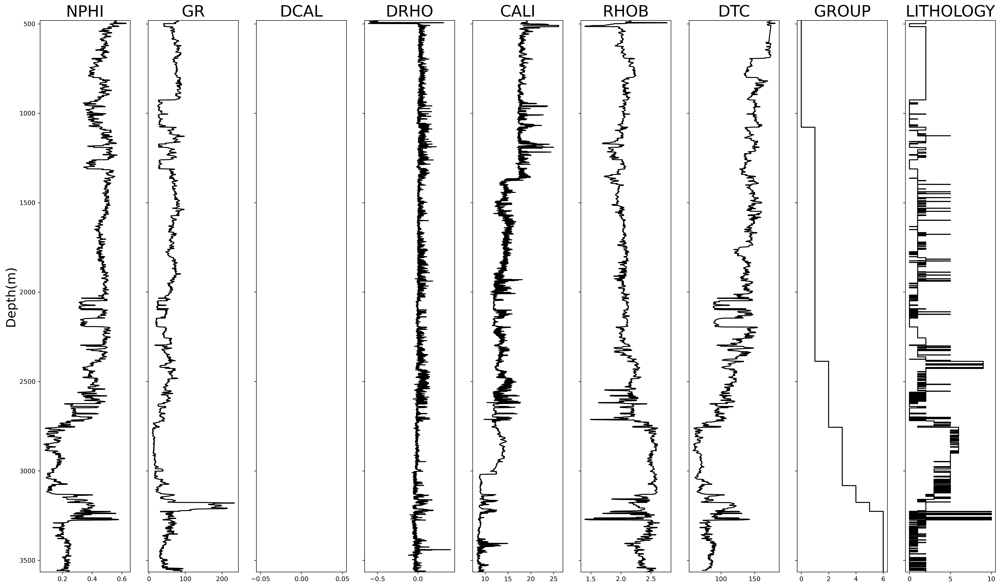

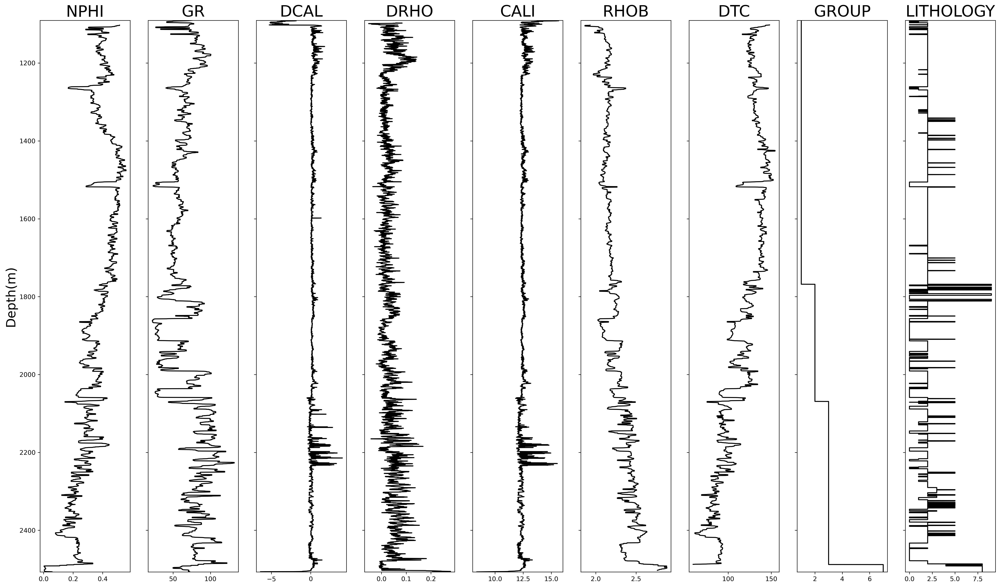

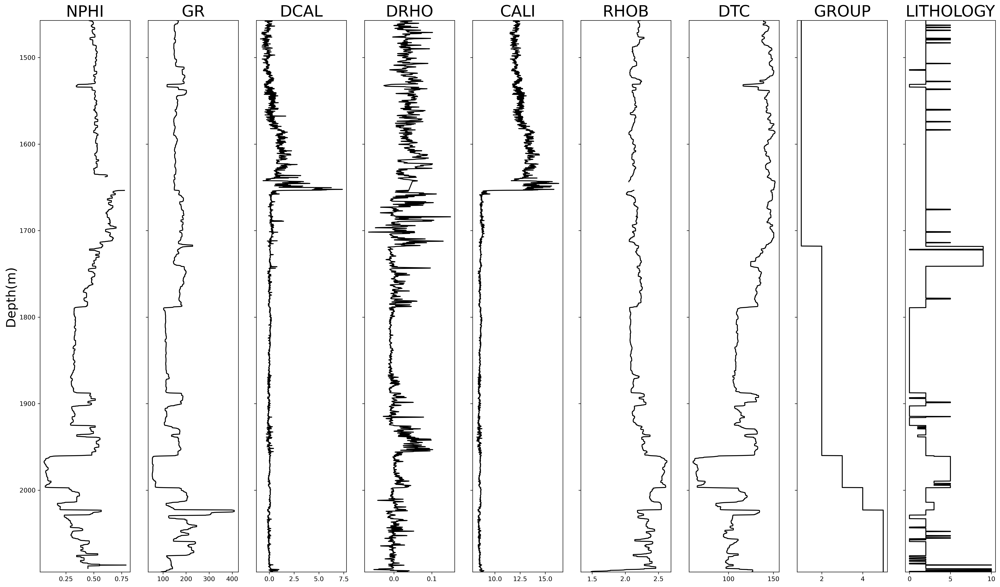

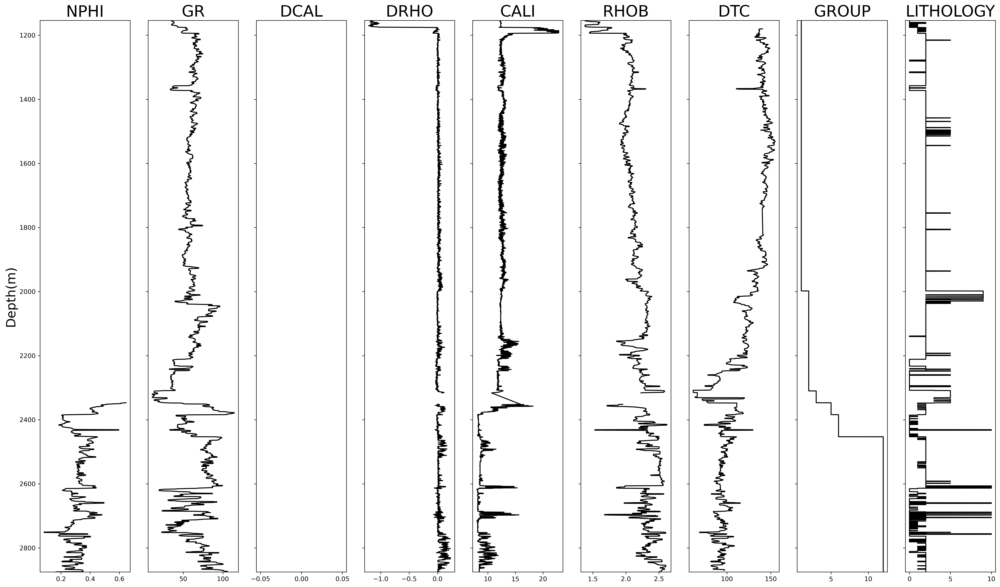

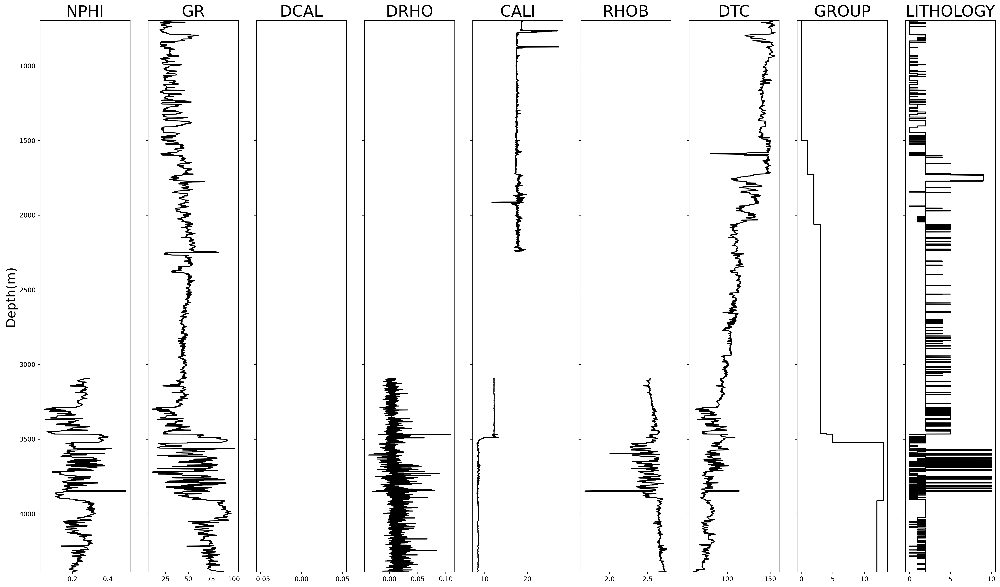

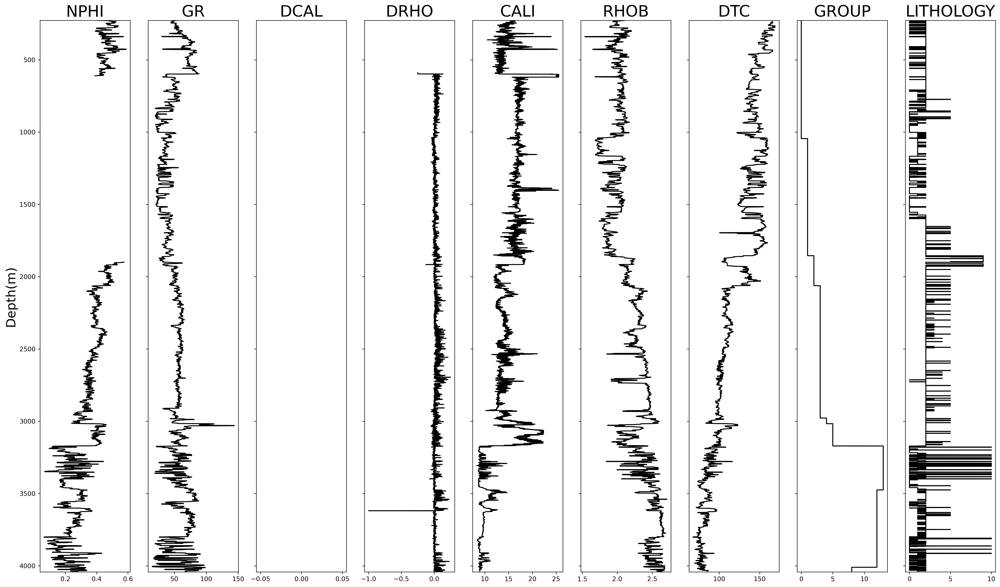

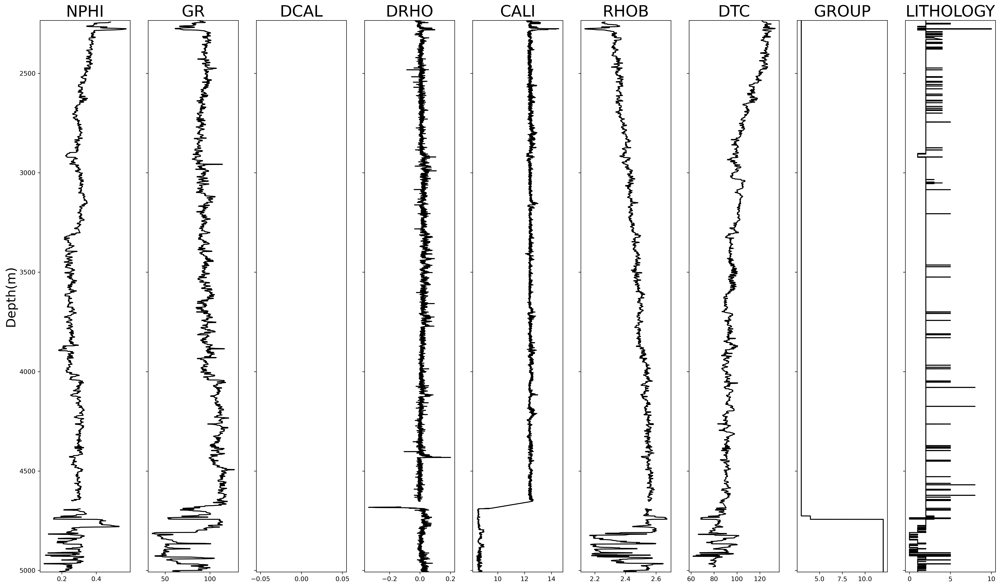

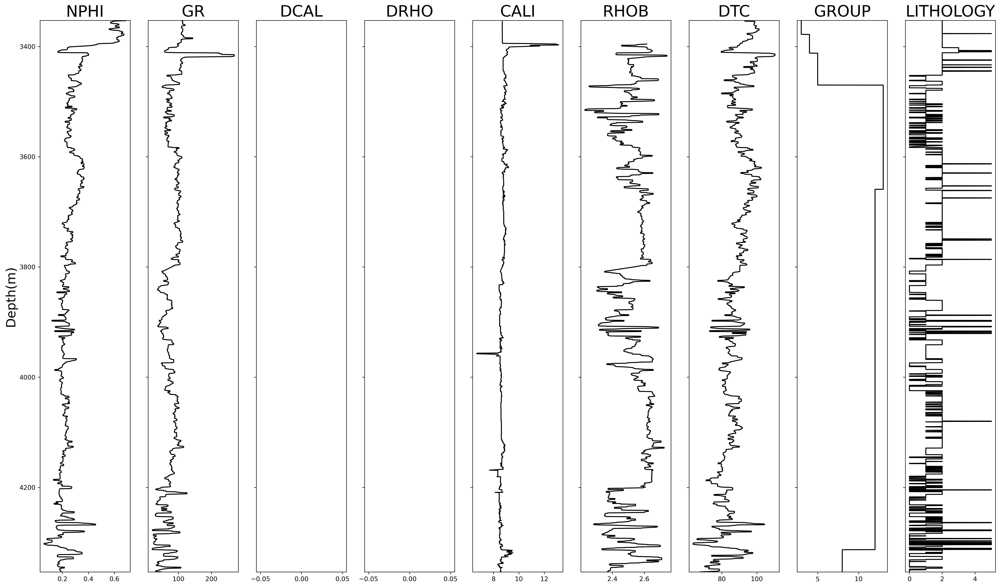

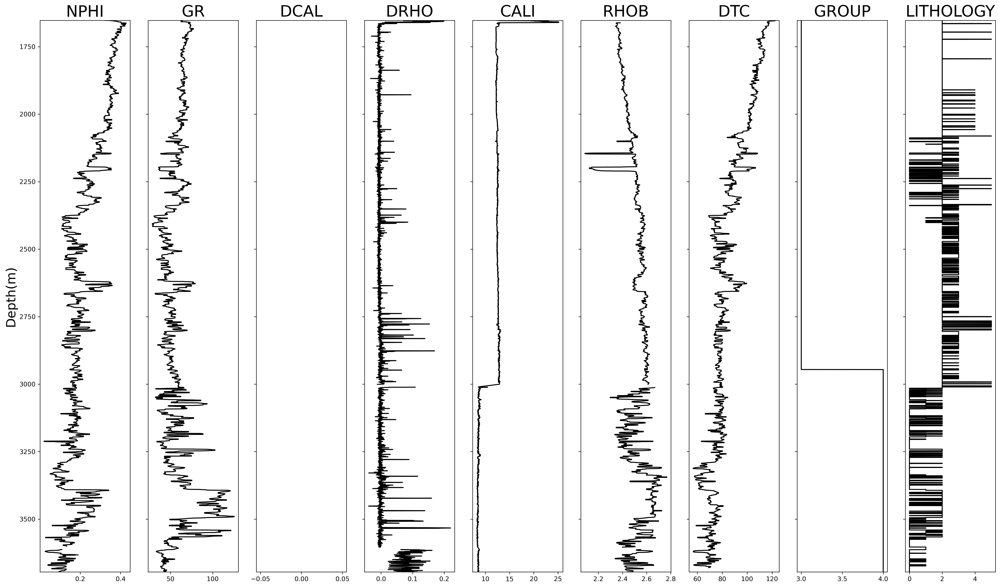

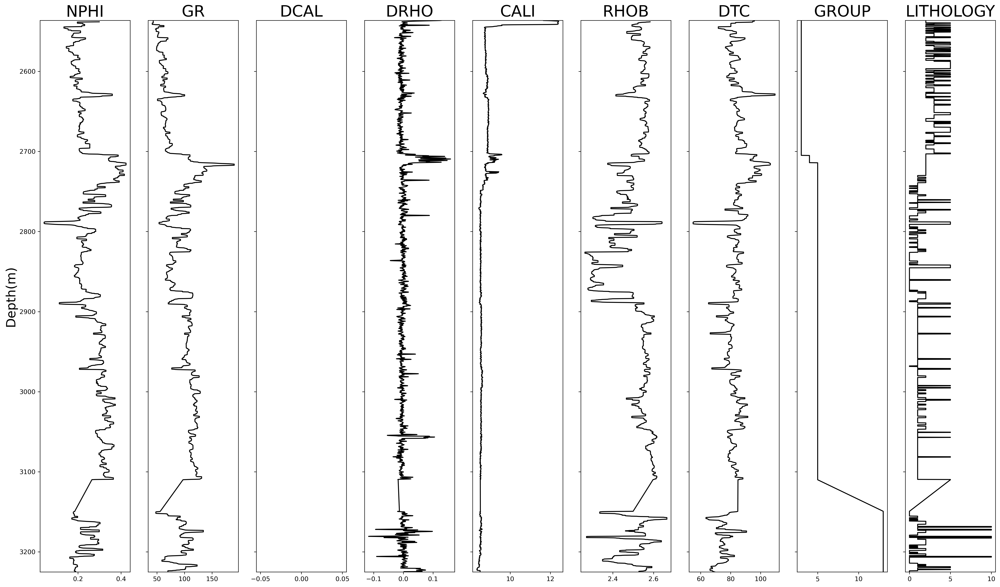

In [14]:
val_well_name = val_set.WELL.unique()
val_well_num = len(val_well_name)

for i in range(val_well_num):  #val_well_num
    print('验证井名：', val_well_name[i])
    marked_well = all_set[all_set.WELL == val_well_name[i]].copy() #param['marked_well']
    plot_well_fea_gp_litho(marked_well)

### 新方案：制作视标准井(每个Group均有)
* 用所有各个井各group内曲线他们的均值表示标准井每个group内各曲线的均值，再以该视标准井来分别标准化每口井的每个Group

#### 统计各口井的各个Group内各曲线的均值和标准差

In [15]:
wells_name = all_set['WELL'].unique()
wells_num = len(all_set['WELL'].unique())
#print('所有井名', wells_name)
print('数据集井数目', wells_num)

stand_info = pd.DataFrame( 
                columns = ['WELL', 'GROUP', 
                           'GR_m', 'RHOB_m', 'NPHI_m', 'DTC_m', 
                           'GR_s', 'RHOB_s', 'NPHI_s', 'DTC_s']) 
#print('stand_info', stand_info)

for i in range(wells_num):
    well = all_set[all_set.WELL == wells_name[i]].copy()
    #print('取出哪口井', wells_name[i])
    #print('well.head()', well.head(), well.columns)
    
    well_gp_name = well['GROUP'].unique()
    #print('well_gp_name' , well_gp_name)
    for j, group in enumerate(well_gp_name):
        
        ##我把nan层段给删除了，但实际上nan层段可鞥log谁有值的，只是层段名缺失。
        ##删除是因为标准井中不需要这一段
        if group is not np.nan:
            #print('group层段名', group)
            ##取出需要的fea,进而算mean和std
            layer = well[well.GROUP == group][param['fea']].copy()
            l_mean = layer.mean()
            l_std = layer.std(ddof=0)
            # print('l_mean', l_mean.shape, l_mean)
            # print('l_std', l_std)

            dict = {'WELL':wells_name[i], 'GROUP':group, 
                    'GR_m':l_mean['GR'], 'RHOB_m':l_mean['RHOB'], 
                    'NPHI_m':l_mean['NPHI'], 'DTC_m':l_mean['DTC'],
                    'GR_s':l_std['GR'], 'RHOB_s':l_std['RHOB'], 
                    'NPHI_s':l_std['NPHI'], 'DTC_s':l_std['DTC']
                    }
            ##直接传入标称属性为value的字典需要写入index,故这里直接设定
            info = pd.DataFrame(dict, index=[0])

            stand_info = stand_info.append(info,ignore_index=True)
        
print('stand_info', stand_info)

数据集井数目 118
stand_info         WELL             GROUP        GR_m    RHOB_m    NPHI_m       DTC_m  \
0    15/9-13      NORDLAND GP.   58.542520  1.846991  0.616350  151.042602   
1    15/9-13     HORDALAND GP.   65.779186  1.989042  0.502057  144.315304   
2    15/9-13      ROGALAND GP.   47.243516  2.084084  0.431506  116.615989   
3    15/9-13      SHETLAND GP.   16.779811  2.548672  0.151722   66.229141   
4    15/9-13  CROMER KNOLL GP.   47.710805  2.433563  0.230776   86.966489   
..       ...               ...         ...       ...       ...         ...   
683   35/9-7      ROGALAND GP.   59.507810  2.165282  0.437264  138.358736   
684   35/9-7      SHETLAND GP.   72.175024  2.470048  0.308347  105.177682   
685   35/9-7  CROMER KNOLL GP.  120.032380  2.462532  0.371493   95.171351   
686   35/9-7        VIKING GP.  105.112026  2.491139  0.292189   85.719436   
687   35/9-7          BAAT GP.   83.233990  2.456851  0.210089   76.751008   

          GR_s    RHOB_s    NPHI_s      D

#### 计算视标准井
* 利用所有井同一层段内的平均值来做视标准井的对应层段内的log值

In [16]:
refer_well = pd.DataFrame(index=gp_name,
                        columns = [
                        'GR_m', 'RHOB_m', 'NPHI_m', 'DTC_m', 
                        'GR_s', 'RHOB_s', 'NPHI_s', 'DTC_s']  ) #{'GROUP':gp_name},
#print('refer_well', refer_well)

for i, group in enumerate(gp_name):
    if group is not np.nan:
        gi = stand_info[stand_info['GROUP'] == group].copy()
        ##reset_index(drop = True)重置index，并去除原来的index
        gi = gi.reset_index(drop = True)

        #print('gi', gi)
        gfea = gi.iloc[:, 2:].copy()
        #print('gfea', gfea)
        gfea_mean = gfea.mean()  ##计算出来的gfea_mean是Series
        #print('刚计算均值后gfea_mean', gfea_mean.shape, gfea_mean)

        gfea_mean = pd.DataFrame(gfea_mean.values.reshape(1,-1), columns=gfea_mean.index)
        #print('gfea_mean', gfea_mean)

        refer_well[refer_well.index == group] = gfea_mean.values
refer_well = refer_well.dropna(how='all', axis=0)
print('refer_well', refer_well)


refer_well                      GR_m   RHOB_m    NPHI_m    DTC_m     GR_s     RHOB_s  \
NORDLAND GP.       61.177  1.99232  0.456747  150.447  14.6873   0.142504   
HORDALAND GP.     71.6055  2.02371  0.486598  145.807  11.3184   0.108226   
ROGALAND GP.      66.3068  2.17131  0.410797   126.63  12.3778  0.0888439   
SHETLAND GP.      55.8846  2.43992  0.266035  92.4038  10.5195  0.0686061   
CROMER KNOLL GP.  73.7858  2.46442  0.296739  95.2703  13.0253  0.0657393   
VIKING GP.        108.211  2.37762  0.342614  100.005  28.4577  0.0965167   
VESTLAND GP.      62.7789  2.36775   0.24571  89.5654  14.8431   0.134692   
ZECHSTEIN GP.     46.8693  2.49537  0.142262  68.5172  28.4148   0.176285   
HEGRE GP.         74.4509  2.48317  0.230368  84.5038  14.6935  0.0609564   
ROTLIEGENDES GP.  107.882  2.52465  0.117194  65.6786  12.0621  0.0332129   
TYNE GP.          201.307  2.40508  0.341302   102.15   49.532  0.0433874   
BOKNFJORD GP.     71.9833  2.33866  0.309131   106.87  39.0499   

#### plot标准化 **之前** 数据同一log所有井的图

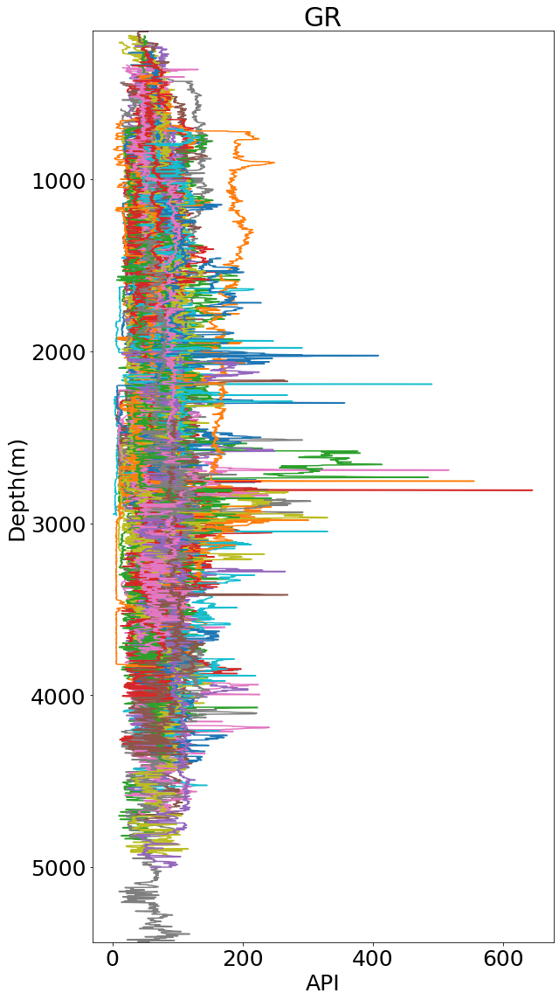

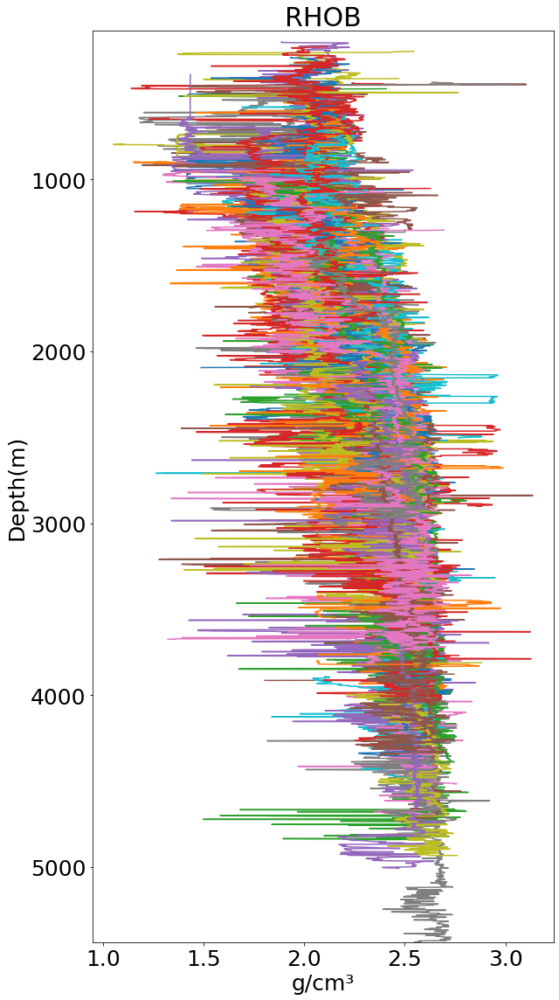

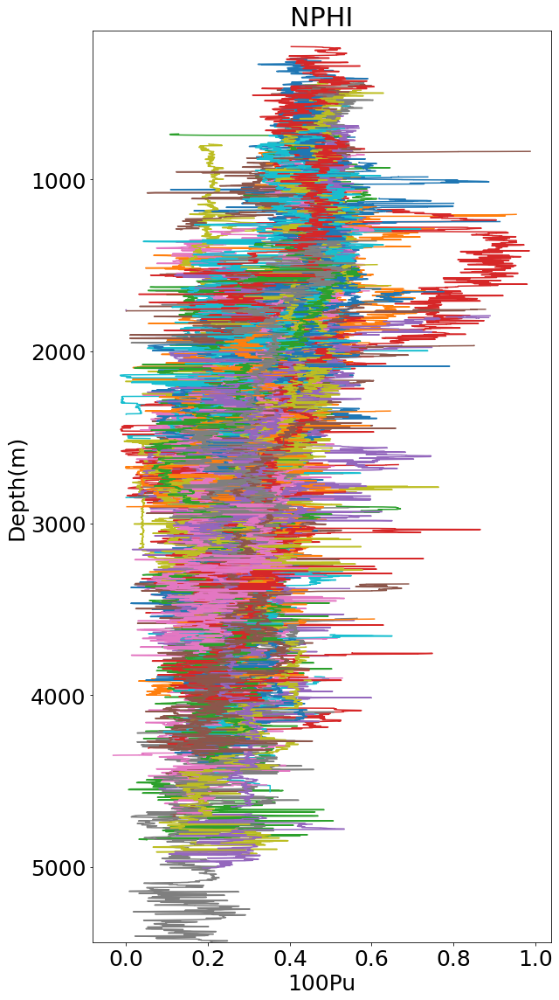

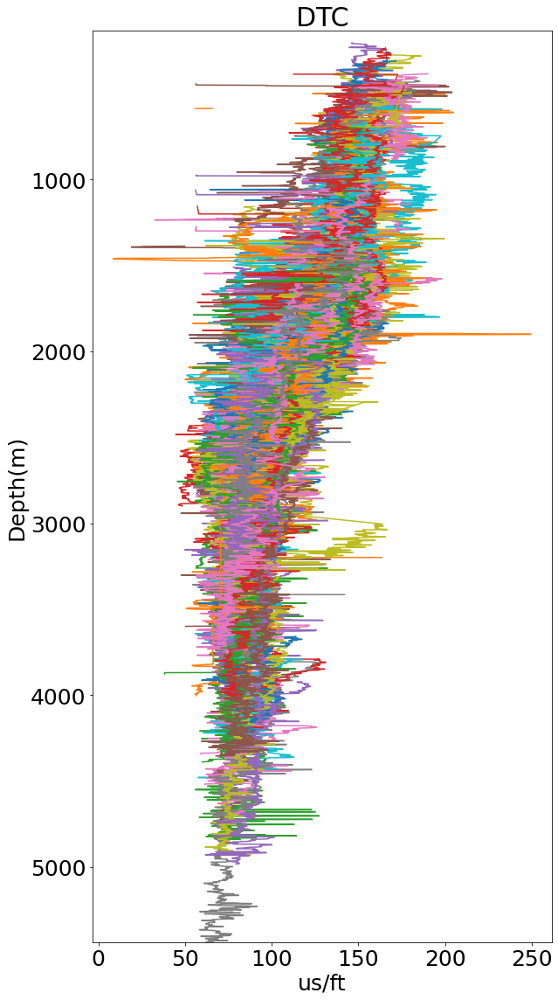

In [17]:
plot_all_wells_fea(all_set, 'GR', param['fig_path'], state='filted')
plot_all_wells_fea(all_set, 'RHOB', param['fig_path'], state='filted')
plot_all_wells_fea(all_set, 'NPHI', param['fig_path'], state='filted')
plot_all_wells_fea(all_set, 'DTC', param['fig_path'], state='filted')

### 按照视标准井得每一GROUP来标准化所有井对应GROUP

In [18]:
standard_data = standard_by_group(all_set, stand_info, refer_well, param['fea'])

当前井名 15/9-13
当前井名 15/9-15
当前井名 15/9-17
当前井名 16/1-2
当前井名 16/1-6 A
当前井名 16/10-1
当前井名 16/10-2
当前井名 16/10-3
当前井名 16/10-5
当前井名 16/11-1 ST3
当前井名 16/2-11 A
当前井名 16/2-16
当前井名 16/2-6
当前井名 16/4-1
当前井名 16/5-3
当前井名 16/7-4
info更改零值后          GR_s    RHOB_s    NPHI_s     DTC_s
99  28.457738  0.013501  0.007363  0.661802
当前井名 16/7-5
当前井名 16/8-1
当前井名 17/11-1
当前井名 25/11-15
当前井名 25/11-19 S
当前井名 25/11-5
当前井名 25/2-13 T4
当前井名 25/2-14
当前井名 25/2-7
当前井名 25/3-1
当前井名 25/4-5
当前井名 25/5-1
当前井名 25/5-4
当前井名 25/6-1
当前井名 25/6-2
当前井名 25/6-3
当前井名 25/7-2
当前井名 25/8-5 S
当前井名 25/8-7
当前井名 25/9-1
当前井名 26/4-1
当前井名 29/6-1
当前井名 30/3-3
当前井名 30/3-5 S
当前井名 30/6-5
当前井名 31/2-1
当前井名 31/2-19 S
当前井名 31/2-7
当前井名 31/2-8
当前井名 31/2-9
当前井名 31/3-1
当前井名 31/3-2
当前井名 31/3-3
当前井名 31/3-4
当前井名 31/4-10
当前井名 31/4-5
当前井名 31/5-4 S
当前井名 31/6-5
当前井名 31/6-8
当前井名 32/2-1
当前井名 33/5-2
当前井名 33/6-3 S
当前井名 33/9-1
当前井名 33/9-17
当前井名 34/10-19
当前井名 34/10-21
当前井名 34/10-33
当前井名 34/10-35
当前井名 34/11-1
当前井名 34/11-2 S
当前井名 34/12-1
当前井名 34/2-4
当前井名 34/3-1 A
当前井名 34/4-10 R


#### plot标准化 **之后** 数据同一log所有井的图

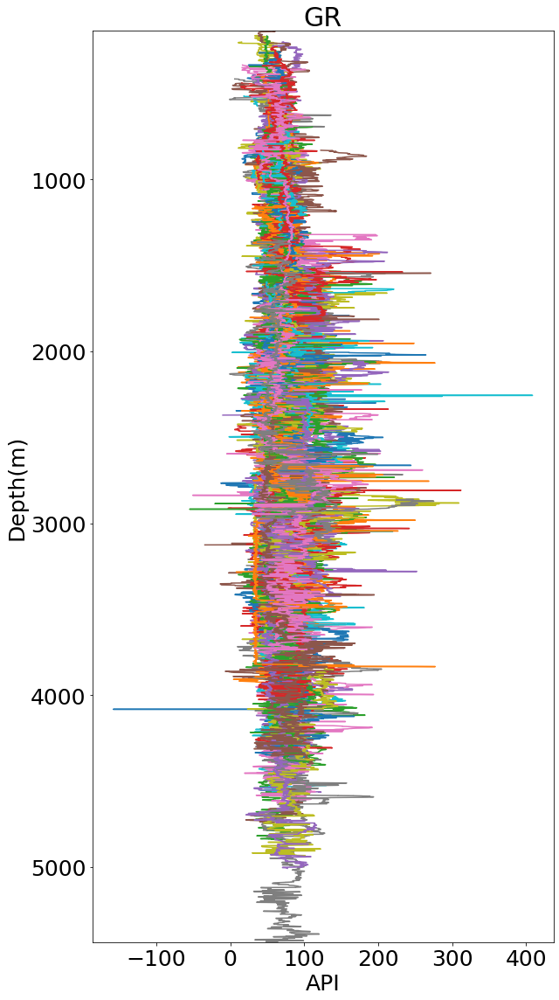

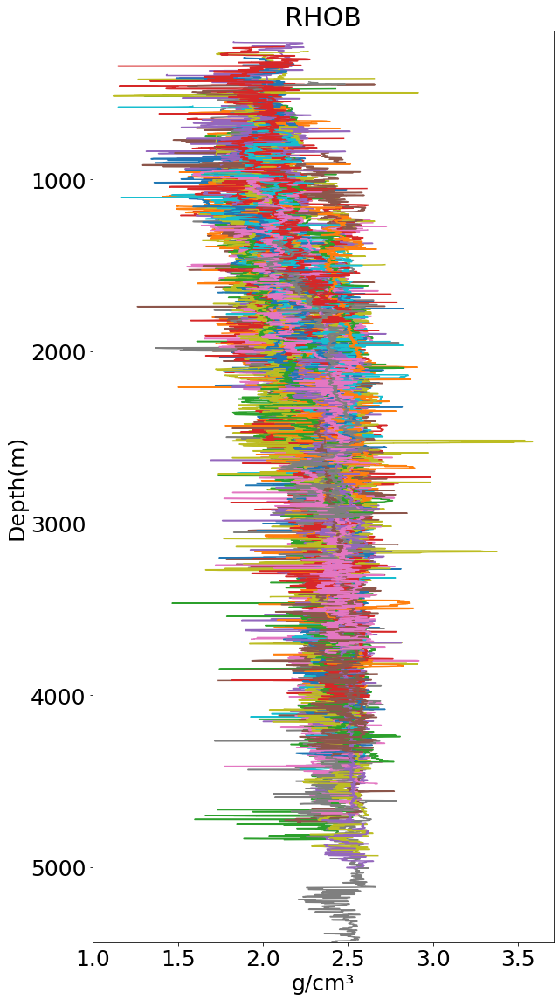

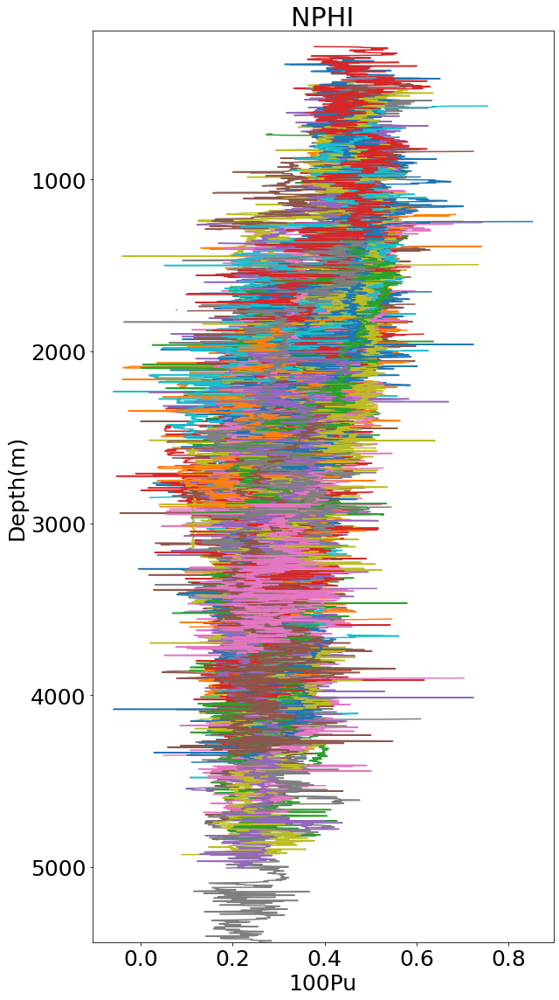

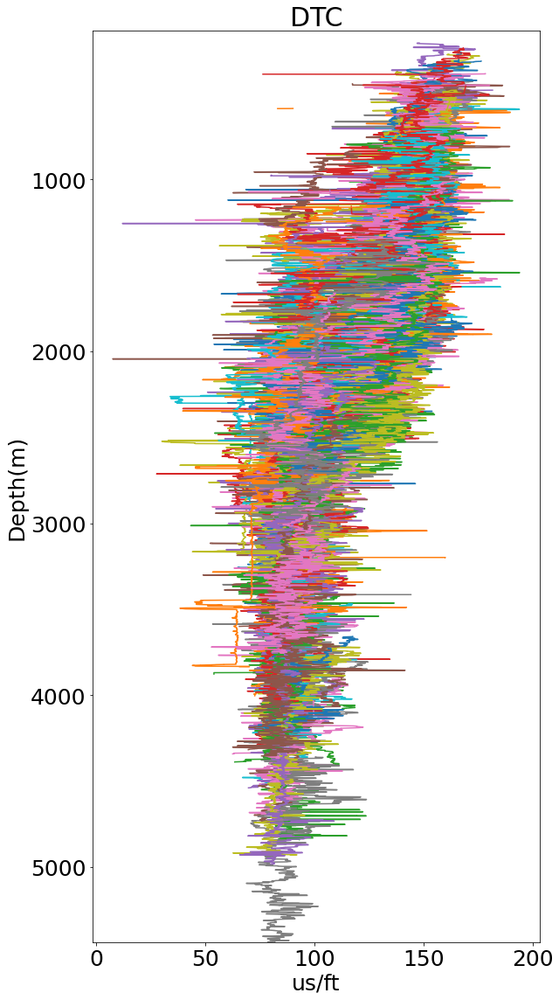

In [19]:
plot_all_wells_fea(standard_data, 'GR', param['fig_path'], state='standed')
plot_all_wells_fea(standard_data, 'RHOB', param['fig_path'], state='standed')
plot_all_wells_fea(standard_data, 'NPHI', param['fig_path'], state='standed')
plot_all_wells_fea(standard_data, 'DTC', param['fig_path'], state='standed')

#### 全井归一化

In [15]:
# train_len = len(new_train_handle)
# val_len = len(val_handle)
# test_len = len(test_handle)

##分割所有井的fea和well_md
all_data_fea = standard_data[param['fea']].copy()
print('all_data_fea.columns', all_data_fea.columns)
all_data_well_md = standard_data[param['well_md']].copy()

normd, mean,std = mean_var_norm(all_data_fea, param['fea'])  #normd is norm_data 
all_data_normd = pd.concat([all_data_well_md, normd],axis=1)
print('all_data_normd', all_data_normd)



all_data_fea.columns Index(['GR', 'RHOB', 'NPHI', 'DTC'], dtype='object')
np_mean (1, 4) [[ 71.38444259   2.28596682   0.33244899 113.28539098]]
np_std (1, 4) [[22.58998274  0.21672449  0.10531198 27.63277418]]
all_data_normd            WELL   DEPTH_MD        GR      RHOB  NPHI       DTC
0       15/9-13   494.5280 -0.197974 -1.381044   NaN  1.691067
1       15/9-13   494.6800 -0.197974 -1.359472   NaN  1.691067
2       15/9-13   494.8320 -0.190155 -1.354328   NaN  1.691067
3       15/9-13   494.9840 -0.102986 -1.322751   NaN  1.691067
4       15/9-13   495.1360 -0.080935 -1.321984   NaN  1.691067
...         ...        ...       ...       ...   ...       ...
122392   35/9-7  2973.2988  0.124649       NaN   NaN -1.028640
122393   35/9-7  2973.4508  0.124649       NaN   NaN -1.034813
122394   35/9-7  2973.6028  0.124649       NaN   NaN -1.040908
122395   35/9-7  2973.7548  0.124649       NaN   NaN -1.044868
122396   35/9-7  2973.9068  0.124649       NaN   NaN -1.045702

[1429694 rows x 6

### 分割保存训练集、验证集、测试集

In [105]:
##查看总数据长度是否改变，改变的话不适用用len来划分数据集
print('len(all_data_normd)', len(all_data_normd))

train_stand = all_data_normd.iloc[:train_len,:]
val_stand = all_data_normd.iloc[train_len:(train_len+val_len),:]
test_stand = all_data_normd.iloc[(train_len+val_len):,:]
print('len(train_stand)',len(train_stand))
print('len(val_stand)',len(val_stand))
print('len(test_stand)',len(test_stand))

print('test_stand', test_stand)

print('val_stand', val_stand['WELL'].unique())
print('test_stand', test_stand['WELL'].unique())

len(all_data_normd) 800826
len(train_stand) 686123
len(val_stand) 56845
len(test_stand) 57858
test_stand            WELL   DEPTH_MD        GR      RHOB     NPHI       DTC
0      34/10-19   291.1040 -1.040475 -2.087334  1.76106       NaN
1      34/10-19   291.2560 -1.040475 -2.102261  1.76106       NaN
2      34/10-19   291.4080 -0.993353 -2.110113  1.76106       NaN
3      34/10-19   291.5600 -0.977621 -2.126035  1.76106       NaN
4      34/10-19   291.7120 -0.951576 -2.126035  1.76106       NaN
...         ...        ...       ...       ...      ...       ...
57853    35/9-7  2973.2988 -0.117682       NaN      NaN -1.046848
57854    35/9-7  2973.4508 -0.117682       NaN      NaN -1.053572
57855    35/9-7  2973.6028 -0.117682       NaN      NaN -1.060211
57856    35/9-7  2973.7548 -0.117682       NaN      NaN -1.064523
57857    35/9-7  2973.9068 -0.117682       NaN      NaN -1.065432

[57858 rows x 6 columns]
val_stand ['34/7-20' '34/10-16 R' '34/6-1 S' '35/9-8' '31/2-21 S']
test_stand

In [106]:
##保存数据，（原大工区的数据保存）
# train_stand.to_csv(param['file_save_path']+'train_standard.csv')
# val_stand.to_csv(param['file_save_path']+'val_standard.csv')
# test_stand.to_csv(param['file_save_path']+'test_standard.csv')

##（缩小工区数据之后的数据保存）
train_stand.to_csv(param['file_save_path']+'mini_train_standard.csv')
val_stand.to_csv(param['file_save_path']+'mini_val_standard.csv')
test_stand.to_csv(param['file_save_path']+'mini_test_standard.csv')